In [3]:
import numpy as np 
import pandas as pd
from sklearn.decomposition import PCA
from utils import *
from scipy.stats import zscore
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from loess import loess_1d
import matplotlib.patches as mpatches
from matplotlib import cm
from operator import * 

## SPCA vs PCA vs PHATE

In [51]:
x = pd.read_csv('data/T47D.csv')
metadata_well = x['Metadata_well']
x = x.drop(['cycD1_over_p21', 'PHATE_1', 'PHATE_2', 'ploidy', 'RB_status', 'phase', 'Metadata_well', 'phate_labs'], axis=1)

x0 = x[metadata_well == 0]
x1 = x[metadata_well == 1]
x10 = x[metadata_well == 10]
x100 = x[metadata_well == 100]
x1000 = x[metadata_well == 1000]

In [2]:
x_spca = pd.read_csv('data/T47D_SPCA.csv')
x_pca = pd.read_csv('data/T47D_PCA.csv')
x_phate = pd.read_csv('data/T47D_PHATE.csv')

x_spca_0 = x_spca[x_spca['metadata_well'] == 0]
x_spca_1 = x_spca[x_spca['metadata_well'] == 1]
x_spca_10 = x_spca[x_spca['metadata_well'] == 10]
x_spca_100 = x_spca[x_spca['metadata_well'] == 100]
x_spca_1000 = x_spca[x_spca['metadata_well'] == 1000]

x_pca_0 = x_pca[x_pca['metadata_well'] == 0]
x_pca_1 = x_pca[x_pca['metadata_well'] == 1]
x_pca_10 = x_pca[x_pca['metadata_well'] == 10]
x_pca_100 = x_pca[x_pca['metadata_well'] == 100]
x_pca_1000 = x_pca[x_pca['metadata_well'] == 1000]

x_phate_0 = x_phate[x_phate['metadata_well'] == 0]
x_phate_1 = x_phate[x_phate['metadata_well'] == 1]
x_phate_10 = x_phate[x_phate['metadata_well'] == 10]
x_phate_100 = x_phate[x_phate['metadata_well'] == 100]
x_phate_1000 = x_phate[x_phate['metadata_well'] == 1000]

In [5]:
# establish variables 
trt_conditions: list[str] = ["", "0", "1", "10", "100", "1000"]

phases_dict = {'G0':'#5CAD92', 
               'G1':'#594997', 
               'G2/M':'#E7739A',
               'S':'#0099CC'}

viridis = cm.get_cmap('viridis', 12)
trt_colors = viridis(np.linspace(0, 1, 5))
trt_colors

array([[0.267004, 0.004874, 0.329415, 1.      ],
       [0.220057, 0.343307, 0.549413, 1.      ],
       [0.119512, 0.607464, 0.540218, 1.      ],
       [0.525776, 0.833491, 0.288127, 1.      ],
       [0.993248, 0.906157, 0.143936, 1.      ]])

In [15]:
x0_phase = x_spca["phase"][x_spca['metadata_well'] == 0]
x1_phase = x_spca["phase"][x_spca['metadata_well'] == 1]
x10_phase = x_spca["phase"][x_spca['metadata_well'] == 10]
x100_phase = x_spca["phase"][x_spca['metadata_well'] == 100]
x1000_phase = x_spca["phase"][x_spca['metadata_well'] == 1000]

In [16]:
x0_phase = x0_phase.to_numpy()
x1_phase = x1_phase.to_numpy()
x10_phase = x10_phase.to_numpy()
x100_phase = x100_phase.to_numpy()
x1000_phase = x1000_phase.to_numpy()

In [17]:
# assign colors according to phase 
x0_phase_colors = []
x1_phase_colors = []
x10_phase_colors = []
x100_phase_colors = []
x1000_phase_colors = []

for i in range(len(x0_phase)): 
    x0_phase_colors.append(phases_dict[x0_phase[i]])

for i in range(len(x1_phase)): 
    x1_phase_colors.append(phases_dict[x1_phase[i]])

for i in range(len(x10_phase)): 
    x10_phase_colors.append(phases_dict[x10_phase[i]])

for i in range(len(x100_phase)): 
    x100_phase_colors.append(phases_dict[x100_phase[i]])

for i in range(len(x1000_phase)): 
    x1000_phase_colors.append(phases_dict[x1000_phase[i]])

## Trajectory Inference 

In [52]:
spca_curve = pd.read_csv('data/T47D_SPCA_Curves.csv')
pca_curve = pd.read_csv('data/T47D_PCA_Curves.csv')
phate_curve = pd.read_csv('data/T47D_PHATE_Curves.csv')

# 150 points generated by Slingshot per curve 
spca_curve_0 = spca_curve.loc[:149]
spca_curve_1 = spca_curve.loc[150:299]
spca_curve_10 = spca_curve.loc[300:449]
spca_curve_100 = spca_curve.loc[450:599]
spca_curve_1000 = spca_curve.loc[600:]

pca_curve_0 = pca_curve.loc[:149]
pca_curve_1 = pca_curve.loc[150:299]
pca_curve_10 = pca_curve.loc[300:449]
pca_curve_100 = pca_curve.loc[450:599]
pca_curve_1000 = pca_curve.loc[600:]

phate_curve_0 = phate_curve.loc[:149]
phate_curve_1 = phate_curve.loc[150:299]
phate_curve_10 = phate_curve.loc[300:449]
phate_curve_100 = phate_curve.loc[450:599]
phate_curve_1000 = phate_curve.loc[600:]

In [53]:
spca_pseudo = pd.read_csv('data/T47D_SPCA_Pseudotimes.csv')
pca_pseudo = pd.read_csv('data/T47D_PCA_Pseudotimes.csv')
phate_pseudo = pd.read_csv('data/T47D_PHATE_Pseudotimes.csv')

spca_pseudo_0 = spca_pseudo[:len(x_spca_0)]
spca_pseudo_1 = spca_pseudo[len(x_spca_0):len(x_spca_0)+len(x_spca_1)]
spca_pseudo_10 = spca_pseudo[len(x_spca_0)+len(x_spca_1):len(x_spca_0)+len(x_spca_1)+len(x_spca_10)]
spca_pseudo_100 = spca_pseudo[len(x_spca_0)+len(x_spca_1)+len(x_spca_10):len(x_spca_0)+len(x_spca_1)+len(x_spca_10)+len(x_spca_100)]
spca_pseudo_1000 = spca_pseudo[len(x_spca_0)+len(x_spca_1)+len(x_spca_10)+len(x_spca_100):]

pca_pseudo_0 = pca_pseudo[:len(x_spca_0)]
pca_pseudo_1 = pca_pseudo[len(x_spca_0):len(x_spca_0)+len(x_spca_1)]
pca_pseudo_10 = pca_pseudo[len(x_spca_0)+len(x_spca_1):len(x_spca_0)+len(x_spca_1)+len(x_spca_10)]
pca_pseudo_100 = pca_pseudo[len(x_spca_0)+len(x_spca_1)+len(x_spca_10):len(x_spca_0)+len(x_spca_1)+len(x_spca_10)+len(x_spca_100)]
pca_pseudo_1000 = pca_pseudo[len(x_spca_0)+len(x_spca_1)+len(x_spca_10)+len(x_spca_100):]

phate_pseudo_0 = phate_pseudo[:len(x_spca_0)]
phate_pseudo_1 = phate_pseudo[len(x_spca_0):len(x_spca_0)+len(x_spca_1)]
phate_pseudo_10 = phate_pseudo[len(x_spca_0)+len(x_spca_1):len(x_spca_0)+len(x_spca_1)+len(x_spca_10)]
phate_pseudo_100 = phate_pseudo[len(x_spca_0)+len(x_spca_1)+len(x_spca_10):len(x_spca_0)+len(x_spca_1)+len(x_spca_10)+len(x_spca_100)]
phate_pseudo_1000 = phate_pseudo[len(x_spca_0)+len(x_spca_1)+len(x_spca_10)+len(x_spca_100):]

In [55]:
x0['pseudotime_spca'] = spca_pseudo_0['pseudotime'].to_list()
x1['pseudotime_spca'] = spca_pseudo_1['pseudotime'].to_list()
x10['pseudotime_spca'] = spca_pseudo_10['pseudotime'].to_list()
x100['pseudotime_spca'] = spca_pseudo_100['pseudotime'].to_list()
x1000['pseudotime_spca'] = spca_pseudo_1000['pseudotime'].to_list()

x0['pseudotime_pca'] = pca_pseudo_0['pseudotime'].to_list()
x1['pseudotime_pca'] = pca_pseudo_1['pseudotime'].to_list()
x10['pseudotime_pca'] = pca_pseudo_10['pseudotime'].to_list()
x100['pseudotime_pca'] = pca_pseudo_100['pseudotime'].to_list()
x1000['pseudotime_pca'] = pca_pseudo_1000['pseudotime'].to_list()

x0['pseudotime_phate'] = phate_pseudo_0['pseudotime'].to_list()
x1['pseudotime_phate'] = phate_pseudo_1['pseudotime'].to_list()
x10['pseudotime_phate'] = phate_pseudo_10['pseudotime'].to_list()
x100['pseudotime_phate'] = phate_pseudo_100['pseudotime'].to_list()
x1000['pseudotime_phate'] = phate_pseudo_1000['pseudotime'].to_list()

/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/842886824.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x0['pseudotime_spca'] = spca_pseudo_0['pseudotime'].to_list()
/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/842886824.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x1['pseudotime_spca'] = spca_pseudo_1['pseudotime'].to_list()
/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/842886824.py:3: SettingWithCopyWarning: 
A value is trying to be set 

## Plots

### Projections: Untreated (0 nM)

/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/3024515531.py:15: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-r" (-> color='r'). The keyword argument will take precedence.
  ax.plot(spca_curve_0['curve_x'], spca_curve_0['curve_y'], spca_curve_0['curve_z'], '-r', linewidth = 3, c='black')


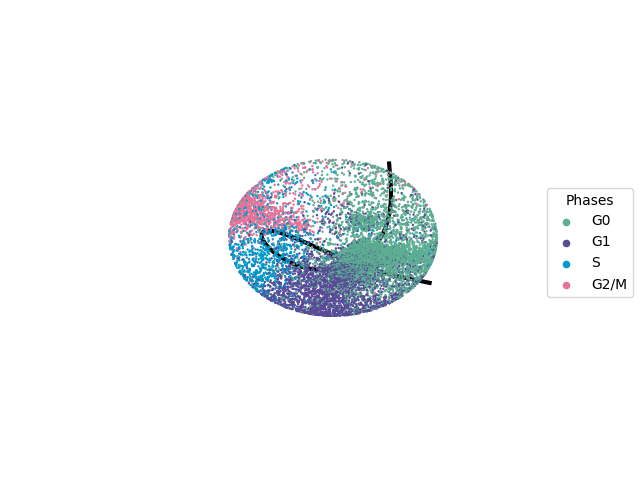

In [42]:
%matplotlib widget

fig = plt.figure()
ax=fig.add_subplot(111,projection='3d')

phase_colors = x0_phase_colors

ax.scatter3D(x_spca_0['SPCA_1'], 
             x_spca_0['SPCA_2'],
             x_spca_0['SPCA_3'],
             alpha=1, 
             c=phase_colors, 
             s=0.5)

ax.plot(spca_curve_0['curve_x'], spca_curve_0['curve_y'], spca_curve_0['curve_z'], '-r', linewidth = 3, c='black')

# Set axis labels
ax.set_xlabel('SPCA 1')
ax.set_ylabel('SPCA 2')
ax.set_zlabel('SPCA 3')

plt.grid(False)
plt.axis('off')

# Add a legend
plt.scatter([], [], c='#5CAD92', s=20, label="G0")
plt.scatter([], [], c='#594997', s=20, label="G1")
plt.scatter([], [], c='#0099CC', s=20, label="S")
plt.scatter([], [], c='#E7739A', s=20, label="G2/M")
plt.legend(bbox_to_anchor=(1.4, 0.5),
        loc="right",
        borderaxespad=2.,
        scatterpoints=1, 
        title="Phases")

ax.view_init(5,340)


# Show the plot
plt.show()

plt.savefig(f"figures/spca_untrt.pdf", format="pdf", bbox_inches="tight")

/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/1652164835.py:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-r" (-> color='r'). The keyword argument will take precedence.
  ax.plot(pca_curve_0['curve_x'], pca_curve_0['curve_y'], pca_curve_0['curve_z'], '-r', linewidth = 3, c='black')


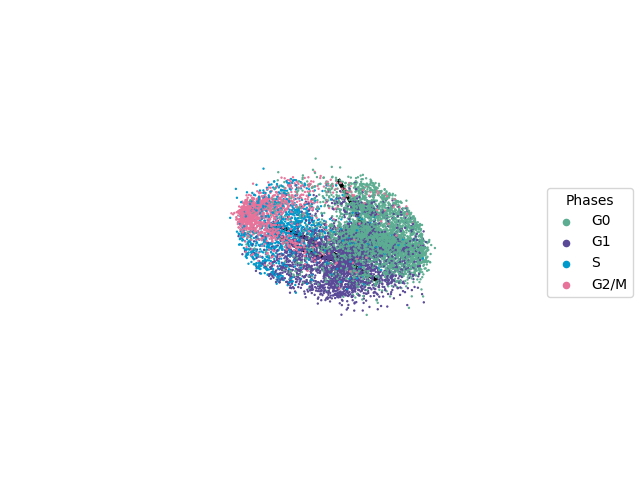

No such comm: 148c1f6c5335440a8e5f4f51c1b3abad


In [69]:
%matplotlib widget

fig = plt.figure()
ax=fig.add_subplot(111,projection='3d')

phase_colors = x0_phase_colors
phases = x0_phase

ax.scatter3D(x_pca_0['PCA_1'], 
             x_pca_0['PCA_2'],
             x_pca_0['PCA_3'],
             alpha=1, 
             c=phase_colors, 
             s=0.5)

ax.plot(pca_curve_0['curve_x'], pca_curve_0['curve_y'], pca_curve_0['curve_z'], '-r', linewidth = 3, c='black')

# Set axis labels
ax.set_xlabel('PHATE 1')
ax.set_ylabel('PHATE 2')
ax.set_zlabel('PHATE 3')

ax.view_init(5,0)

plt.grid(False)
plt.axis('off')

# Add a legend
plt.scatter([], [], c='#5CAD92', s=20, label="G0")
plt.scatter([], [], c='#594997', s=20, label="G1")
plt.scatter([], [], c='#0099CC', s=20, label="S")
plt.scatter([], [], c='#E7739A', s=20, label="G2/M")
plt.legend(bbox_to_anchor=(1.4, 0.5),
        loc="right",
        borderaxespad=2.,
        scatterpoints=1, 
        title="Phases")


# Show the plot
plt.show()

plt.savefig(f"figures/pca_untrt.pdf", format="pdf", bbox_inches="tight")

/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/1777335554.py:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-r" (-> color='r'). The keyword argument will take precedence.
  ax.plot(phate_curve_0['curve_x'], phate_curve_0['curve_y'], phate_curve_0['curve_z'], '-r', linewidth = 3, c='black')


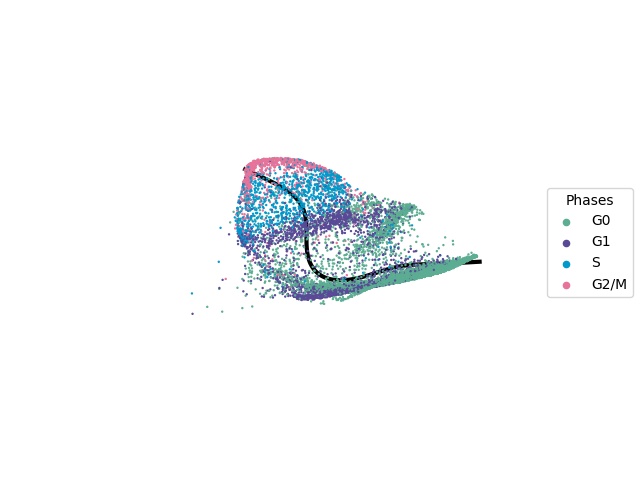

In [67]:
%matplotlib widget

fig = plt.figure()
ax=fig.add_subplot(111,projection='3d')

phase_colors = x0_phase_colors
phases = x0_phase

ax.scatter3D(x_phate_0['PHATE_1'], 
             x_phate_0['PHATE_2'],
             x_phate_0['PHATE_3'],
             alpha=1, 
             c=phase_colors, 
             s=0.5)

ax.plot(phate_curve_0['curve_x'], phate_curve_0['curve_y'], phate_curve_0['curve_z'], '-r', linewidth = 3, c='black')

# Set axis labels
ax.set_xlabel('PHATE 1')
ax.set_ylabel('PHATE 2')
ax.set_zlabel('PHATE 3')

ax.view_init(5,50)

plt.grid(False)
plt.axis('off')

# Add a legend
plt.scatter([], [], c='#5CAD92', s=20, label="G0")
plt.scatter([], [], c='#594997', s=20, label="G1")
plt.scatter([], [], c='#0099CC', s=20, label="S")
plt.scatter([], [], c='#E7739A', s=20, label="G2/M")
plt.legend(bbox_to_anchor=(1.4, 0.5),
        loc="right",
        borderaxespad=2.,
        scatterpoints=1, 
        title="Phases")


# Show the plot
plt.show()

plt.savefig(f"figures/phate_untrt.pdf", format="pdf", bbox_inches="tight")

### Projections: All Treatment Conditions

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

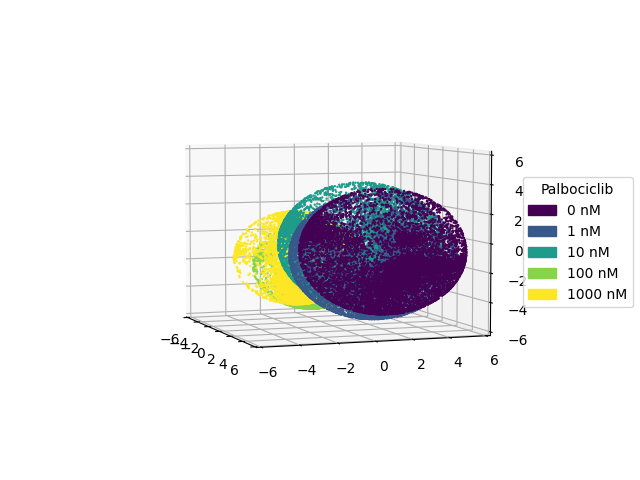

In [70]:
%matplotlib widget

# Create a 3D scatterplot
fig = plt.figure()
ax=fig.add_subplot(111,projection='3d')

for i in range(1, len(trt_conditions)): 
    ax.scatter3D(vars()[f'x_spca_{trt_conditions[i]}']['SPCA_1'],
                 vars()[f'x_spca_{trt_conditions[i]}']['SPCA_2'],
                 vars()[f'x_spca_{trt_conditions[i]}']['SPCA_3'],
                alpha=1, 
                c=trt_colors[i-1],
                s=0.5)
    
plt.xlim(-6, 6)
plt.ylim(-6, 6)
ax.set_zlim(-6, 6)

# Add a legend
color_0 = mpatches.Patch(color=trt_colors[0], label='0 nM')
color_1 = mpatches.Patch(color=trt_colors[1], label='1 nM')
color_10 = mpatches.Patch(color=trt_colors[2], label='10 nM')
color_100 = mpatches.Patch(color=trt_colors[3], label='100 nM')
color_1000 = mpatches.Patch(color=trt_colors[4], label='1000 nM')
ax.legend(bbox_to_anchor=(1.4, 0.5),
            loc="right",
            borderaxespad=2.,
            title="Palbociclib",
            handles=[color_0, color_1, color_10, color_100, color_1000])

ax.view_init(5,340)

# plt.grid(False)
# plt.axis('off')

# Show the plot
plt.show()

plt.savefig("figures/spca_all_trt.pdf", format="pdf", bbox_inches="tight")

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

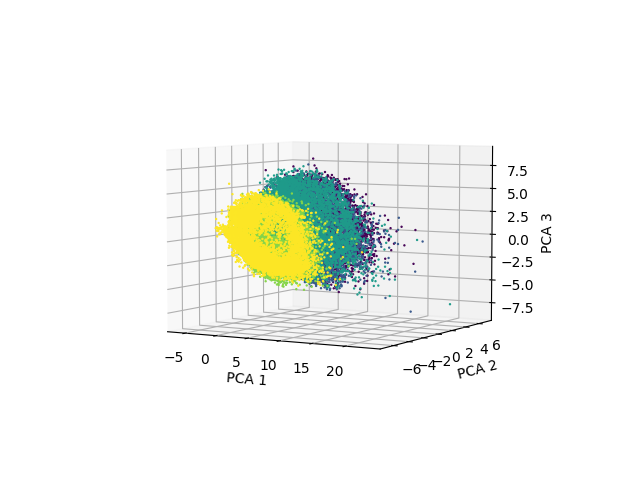

In [47]:
%matplotlib widget

# Create a 3D scatterplot
fig = plt.figure()
ax=fig.add_subplot(111,projection='3d')

for i in range(1, 6): 
    ax.scatter3D(vars()[f'x_pca_{trt_conditions[i]}']['PCA_1'],
                 vars()[f'x_pca_{trt_conditions[i]}']['PCA_2'],
                 vars()[f'x_pca_{trt_conditions[i]}']['PCA_3'],
                alpha=1, 
                c=trt_colors[i-1],
                s=0.5)


# Set axis labels
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')

ax.view_init(5,300)

# plt.grid(False)
# plt.axis('off')

# Show the plot
plt.show()

plt.savefig("figures/pca_all_trt.pdf", format="pdf", bbox_inches="tight")

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

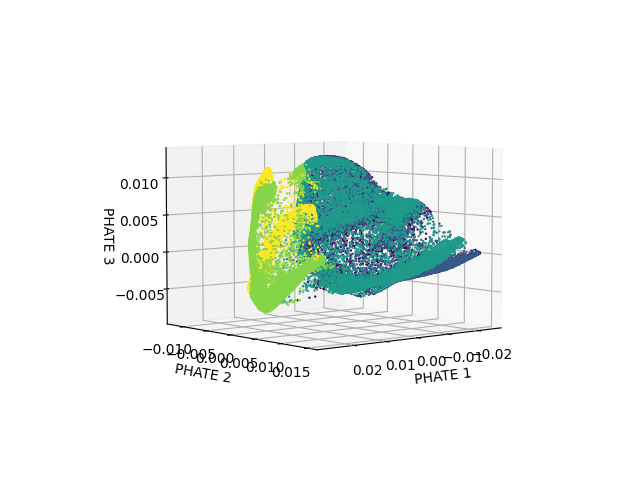

In [27]:
fig = plt.figure()
ax=fig.add_subplot(111, projection="3d")

for i in range(1, len(trt_conditions)): 
    ax.scatter3D(vars()[f'x_phate_{trt_conditions[i]}']['PHATE_1'],
                 vars()[f'x_phate_{trt_conditions[i]}']['PHATE_2'],
                 vars()[f'x_phate_{trt_conditions[i]}']['PHATE_3'],
                alpha=1, 
                c=trt_colors[i-1],
                s=0.5)

# Set axis labels
ax.set_xlabel('PHATE 1')
ax.set_ylabel('PHATE 2')
ax.set_zlabel('PHATE 3')

# plt.xticks(np.arange(-0.02, 0.06, 0.02))
# plt.yticks(np.arange(-0.03, 0.05, 0.02))
# ax.set_zticks(np.arange(-0.02, 0.03, 0.02))

ax.view_init(5,50)

# plt.grid(False)
# plt.axis('off')

# Show the plot
plt.show()

plt.savefig("figures/phate_all_trt.pdf", format="pdf", bbox_inches="tight")

### Feature Exp vs Pseudotime

In [56]:
x0_sorted = x0
x0_sorted['phase_colors'] = x0_phase_colors
x1_sorted = x1
x1_sorted['phase_colors'] = x1_phase_colors
x10_sorted = x10
x10_sorted['phase_colors'] = x10_phase_colors
x100_sorted = x100
x100_sorted['phase_colors'] = x100_phase_colors
x1000_sorted = x1000
x1000_sorted['phase_colors'] = x1000_phase_colors

/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/540281031.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x0_sorted['phase_colors'] = x0_phase_colors
/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/540281031.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x1_sorted['phase_colors'] = x1_phase_colors
/var/folders/9p/p4yl9s1d43b3by_cf1ct1pl80000gn/T/ipykernel_27036/540281031.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

In [57]:
x0_sorted_spca = x0.sort_values('pseudotime_spca')
x1_sorted_spca = x1.sort_values('pseudotime_spca')
x10_sorted_spca = x10.sort_values('pseudotime_spca')
x100_sorted_spca = x100.sort_values('pseudotime_spca')
x1000_sorted_spca = x1000.sort_values('pseudotime_spca')

x0_sorted_pca = x0.sort_values('pseudotime_pca')
x1_sorted_pca = x1.sort_values('pseudotime_pca')
x10_sorted_pca = x10.sort_values('pseudotime_pca')
x100_sorted_pca = x100.sort_values('pseudotime_pca')
x1000_sorted_pca = x1000.sort_values('pseudotime_pca')

x0_sorted_phate = x0.sort_values('pseudotime_phate')
x1_sorted_phate = x1.sort_values('pseudotime_phate')
x10_sorted_phate = x10.sort_values('pseudotime_phate')
x100_sorted_phate = x100.sort_values('pseudotime_phate')
x1000_sorted_phate = x1000.sort_values('pseudotime_phate')

In [58]:
# scale pseudotimes 
x0_sorted_spca['pseudotime_scaled'] = x0_sorted_spca['pseudotime_spca']/max(x0_sorted_spca['pseudotime_spca'])
x1_sorted_spca['pseudotime_scaled'] = x1_sorted_spca['pseudotime_spca']/max(x1_sorted_spca['pseudotime_spca'])
x10_sorted_spca['pseudotime_scaled'] = x10_sorted_spca['pseudotime_spca']/max(x10_sorted_spca['pseudotime_spca'])
x100_sorted_spca['pseudotime_scaled'] = x100_sorted_spca['pseudotime_spca']/max(x100_sorted_spca['pseudotime_spca'])
x1000_sorted_spca['pseudotime_scaled'] = x1000_sorted_spca['pseudotime_spca']/max(x1000_sorted_spca['pseudotime_spca'])

x0_sorted_pca['pseudotime_scaled'] = x0_sorted_pca['pseudotime_pca']/max(x0_sorted_pca['pseudotime_pca'])
x1_sorted_pca['pseudotime_scaled'] = x1_sorted_pca['pseudotime_pca']/max(x1_sorted_pca['pseudotime_pca'])
x10_sorted_pca['pseudotime_scaled'] = x10_sorted_pca['pseudotime_pca']/max(x10_sorted_pca['pseudotime_pca'])
x100_sorted_pca['pseudotime_scaled'] = x100_sorted_pca['pseudotime_pca']/max(x100_sorted_pca['pseudotime_pca'])
x1000_sorted_pca['pseudotime_scaled'] = x1000_sorted_pca['pseudotime_pca']/max(x1000_sorted_pca['pseudotime_pca'])

x0_sorted_phate['pseudotime_scaled'] = x0_sorted_phate['pseudotime_phate']/max(x0_sorted_phate['pseudotime_phate'])
x1_sorted_phate['pseudotime_scaled'] = x1_sorted_phate['pseudotime_phate']/max(x1_sorted_phate['pseudotime_phate'])
x10_sorted_phate['pseudotime_scaled'] = x10_sorted_phate['pseudotime_phate']/max(x10_sorted_phate['pseudotime_phate'])
x100_sorted_phate['pseudotime_scaled'] = x100_sorted_phate['pseudotime_phate']/max(x100_sorted_phate['pseudotime_phate'])
x1000_sorted_phate['pseudotime_scaled'] = x1000_sorted_phate['pseudotime_phate']/max(x1000_sorted_phate['pseudotime_phate'])

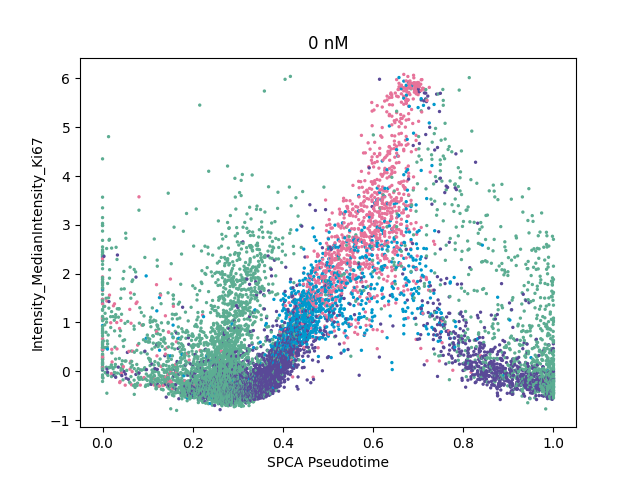

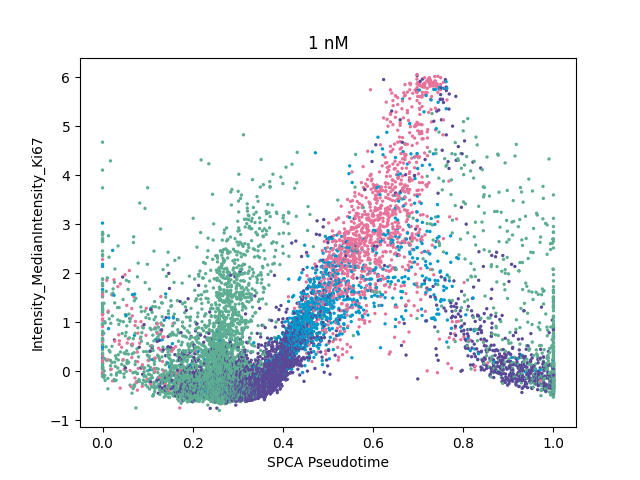

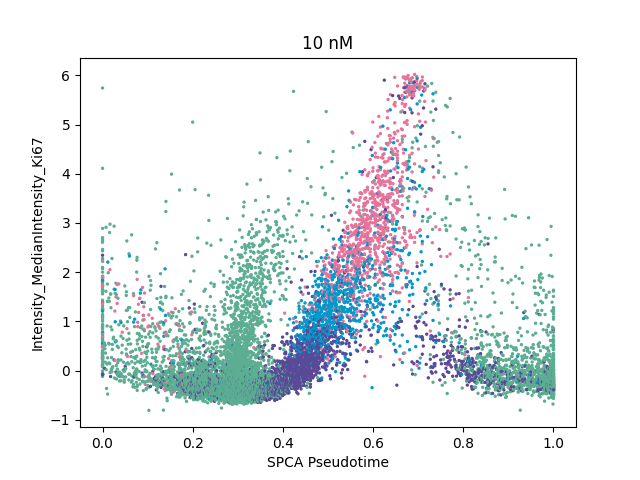

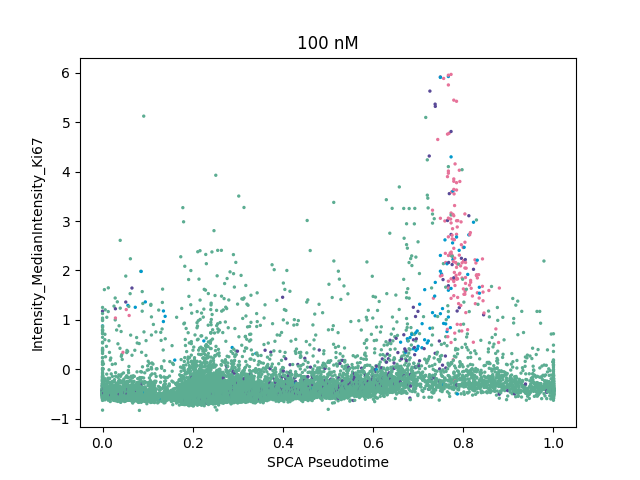

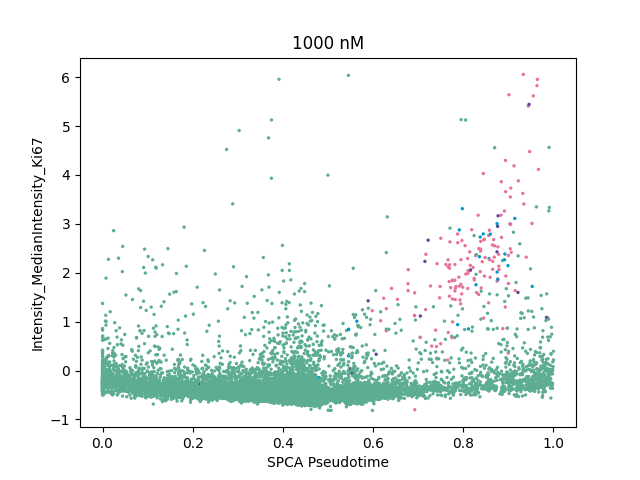

In [60]:
feature = 'Intensity_MedianIntensity_Ki67'
for i in range(1, len(trt_conditions)):
    fig = plt.figure()
    ax=fig.add_subplot(111)
    sling_colors = vars()[f'x{trt_conditions[i]}_sorted_spca']['phase_colors']
    ax.scatter(vars()[f'x{trt_conditions[i]}_sorted_spca']['pseudotime_scaled'], vars()[f'x{trt_conditions[i]}_sorted_spca'][feature], c=sling_colors, s=2)
    plt.xlabel('SPCA Pseudotime')
    plt.ylabel(feature)
    plt.title(f'{trt_conditions[i]} nM')
    plt.show()

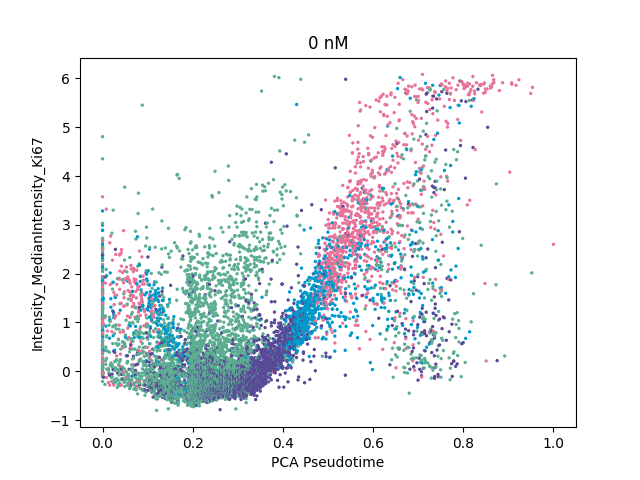

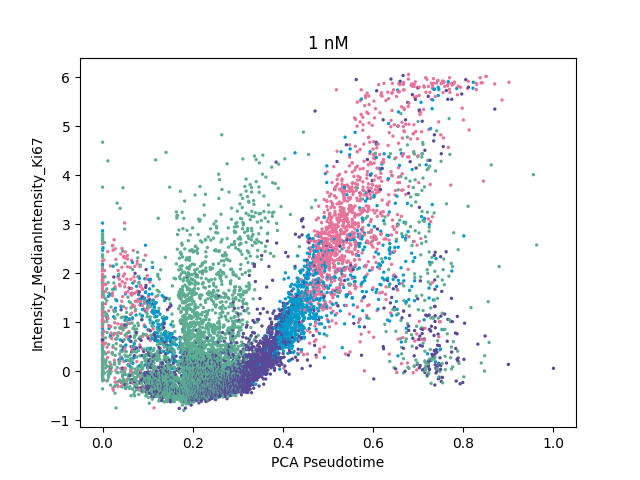

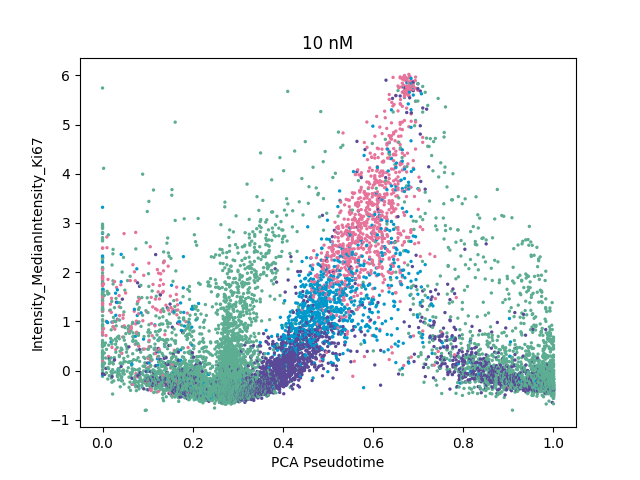

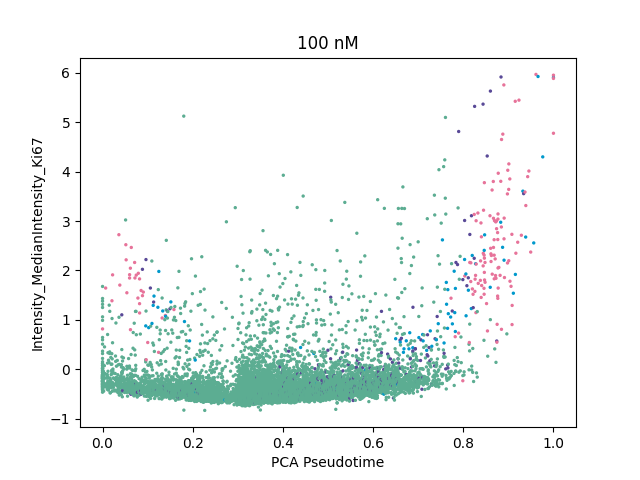

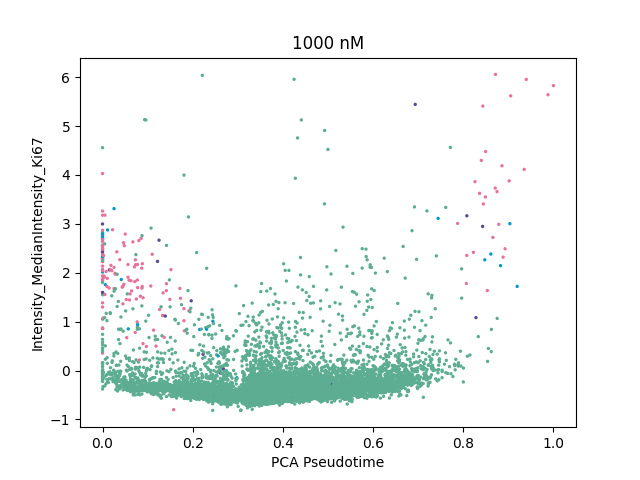

In [61]:
feature = 'Intensity_MedianIntensity_Ki67'
for i in range(1, len(trt_conditions)):
    fig = plt.figure()
    ax=fig.add_subplot(111)
    sling_colors = vars()[f'x{trt_conditions[i]}_sorted_pca']['phase_colors']
    ax.scatter(vars()[f'x{trt_conditions[i]}_sorted_pca']['pseudotime_scaled'], vars()[f'x{trt_conditions[i]}_sorted_pca'][feature], c=sling_colors, s=2)
    plt.xlabel('PCA Pseudotime')
    plt.ylabel(feature)
    plt.title(f'{trt_conditions[i]} nM')
    plt.show()

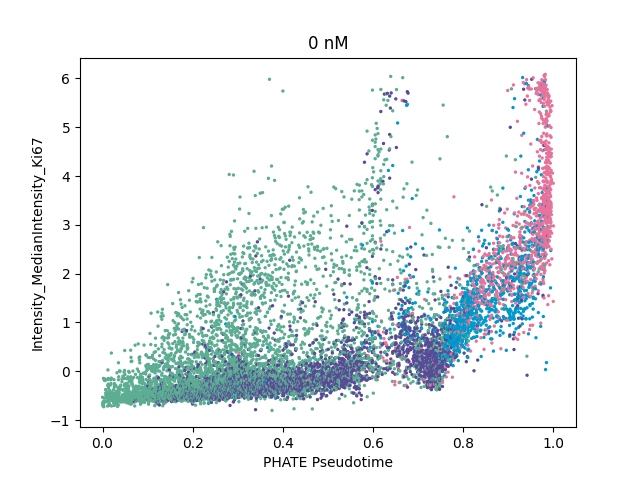

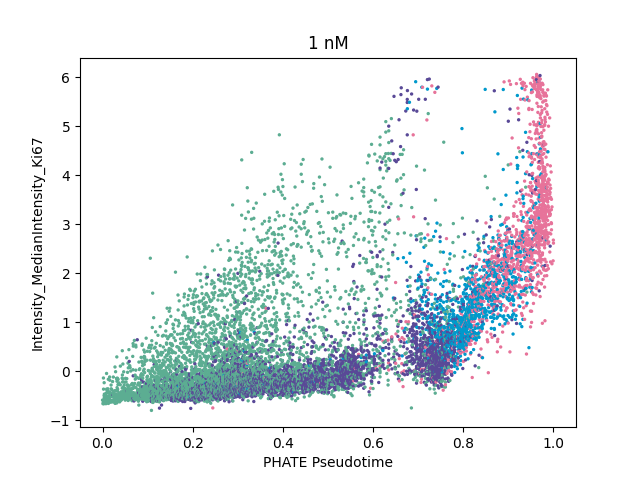

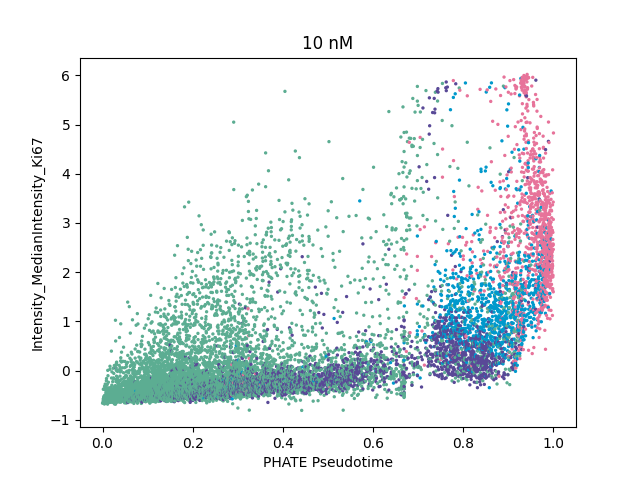

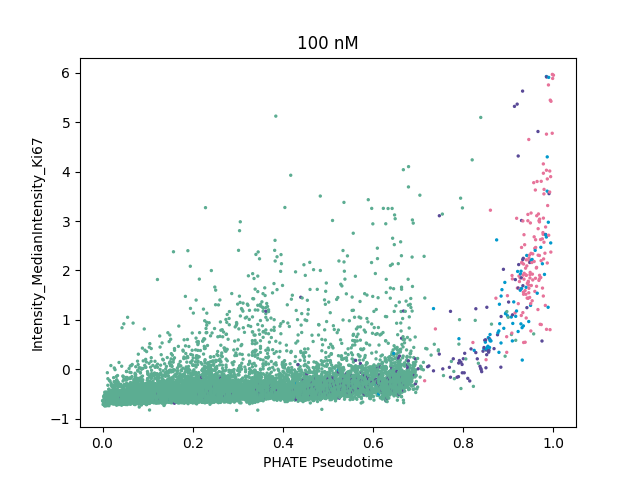

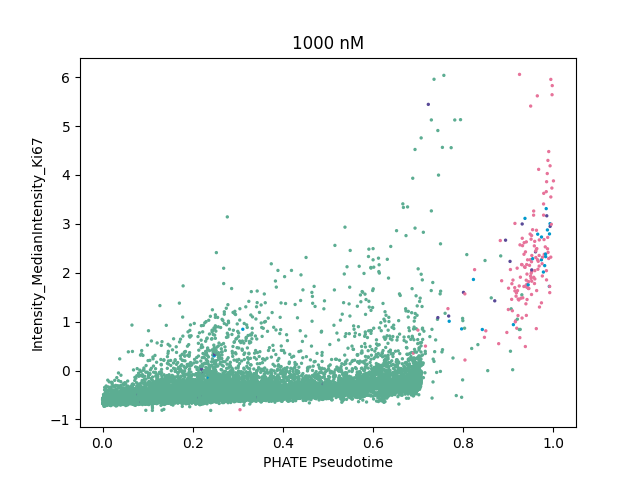

In [62]:
feature = 'Intensity_MedianIntensity_Ki67'
for i in range(1, len(trt_conditions)):
    fig = plt.figure()
    ax=fig.add_subplot(111)
    sling_colors = vars()[f'x{trt_conditions[i]}_sorted_phate']['phase_colors']
    ax.scatter(vars()[f'x{trt_conditions[i]}_sorted_phate']['pseudotime_scaled'], vars()[f'x{trt_conditions[i]}_sorted_phate'][feature], c=sling_colors, s=2)
    plt.xlabel('PHATE Pseudotime')
    plt.ylabel(feature)
    plt.title(f'{trt_conditions[i]} nM')
    plt.show()

In [65]:
x0_loess_spca = pd.DataFrame()
x0_loess_spca['pseudotime_scaled'] = x0_sorted_spca['pseudotime_scaled']

x0_loess_pca = pd.DataFrame()
x0_loess_pca['pseudotime_scaled'] = x0_sorted_pca['pseudotime_scaled']

x0_loess_phate = pd.DataFrame()
x0_loess_phate['pseudotime_scaled'] = x0_sorted_phate['pseudotime_scaled']

In [64]:
feature_names = x0.columns[:len(x0.columns)-4]

In [66]:
xx = x0_loess_spca['pseudotime_scaled']
for i in range(len(feature_names)):
    yy = x0_sorted_spca[feature_names[i]]
    xout, yout, wout = loess_1d.loess_1d(xx.to_numpy(), yy.to_numpy())
    x0_loess_spca[feature_names[i]] = yout

In [71]:
xx = x0_loess_pca['pseudotime_scaled']
for i in range(len(feature_names)):
    print(i)
    yy = x0_sorted_pca[feature_names[i]]
    xout, yout, wout = loess_1d.loess_1d(xx.to_numpy(), yy.to_numpy())
    x0_loess_pca[feature_names[i]] = yout

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


In [72]:
xx = x0_loess_phate['pseudotime_scaled']
for i in range(len(feature_names)):
    print(i)
    yy = x0_sorted_phate[feature_names[i]]
    xout, yout, wout = loess_1d.loess_1d(xx.to_numpy(), yy.to_numpy())
    x0_loess_phate[feature_names[i]] = yout

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


In [73]:
x0_loess_spca.to_csv("data/spca_loess_untrt.csv", index = False)
x0_loess_pca.to_csv("data/pca_loess_untrt.csv", index = False)
x0_loess_phate.to_csv("data/phate_loess_untrt.csv", index = False)

### Cell Cycle Trends 

In [83]:
feature_names

Index(['AreaShape_Area', 'Intensity_IntegratedIntensity_DNA',
       'Intensity_MedianIntensity_CDK2', 'Intensity_MedianIntensity_CDK4',
       'Intensity_MedianIntensity_CDK6', 'Intensity_MedianIntensity_Cdh1',
       'Intensity_MedianIntensity_Cdt1', 'Intensity_MedianIntensity_DNA',
       'Intensity_MedianIntensity_E2F1', 'Intensity_MedianIntensity_ER',
       'Intensity_MedianIntensity_Ki67', 'Intensity_MedianIntensity_PR',
       'Intensity_MedianIntensity_RB', 'Intensity_MedianIntensity_Skp2',
       'Intensity_MedianIntensity_cycA', 'Intensity_MedianIntensity_cycB1',
       'Intensity_MedianIntensity_cycD1', 'Intensity_MedianIntensity_cycE',
       'Intensity_MedianIntensity_p21', 'Intensity_MedianIntensity_pRB',
       'pRB_over_RB'],
      dtype='object')

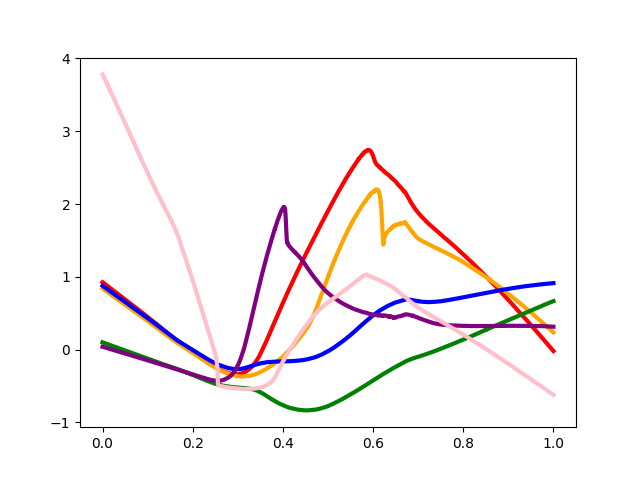

In [84]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(x0_loess_spca['pseudotime_scaled'], x0_loess_spca['Intensity_MedianIntensity_cycA'], label='cycA', c='red', linewidth='3')
ax.plot(x0_loess_spca['pseudotime_scaled'], x0_loess_spca['Intensity_MedianIntensity_cycB1'], label='cycB1', c='orange', linewidth='3')
ax.plot(x0_loess_spca['pseudotime_scaled'], x0_loess_spca['Intensity_MedianIntensity_cycD1'], label='cycD1', c='green', linewidth='3')
ax.plot(x0_loess_spca['pseudotime_scaled'], x0_loess_spca['Intensity_MedianIntensity_cycE'], label='cycE', c='blue', linewidth='3')
ax.plot(x0_loess_spca['pseudotime_scaled'], x0_loess_spca['Intensity_MedianIntensity_E2F1'], label='E2F1', c='purple', linewidth='3')
ax.plot(x0_loess_spca['pseudotime_scaled'], x0_loess_spca['Intensity_IntegratedIntensity_DNA'], label='DNA', c='pink', linewidth='3')


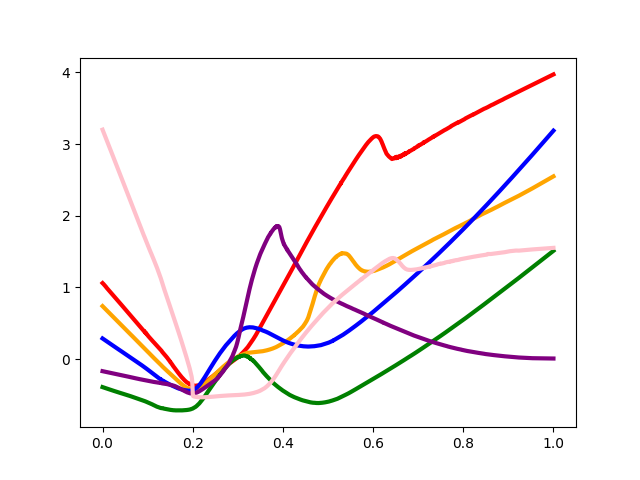

In [85]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(x0_loess_pca['pseudotime_scaled'], x0_loess_pca['Intensity_MedianIntensity_cycA'], label='cycA', c='red', linewidth='3')
ax.plot(x0_loess_pca['pseudotime_scaled'], x0_loess_pca['Intensity_MedianIntensity_cycB1'], label='cycB1', c='orange', linewidth='3')
ax.plot(x0_loess_pca['pseudotime_scaled'], x0_loess_pca['Intensity_MedianIntensity_cycD1'], label='cycD1', c='green', linewidth='3')
ax.plot(x0_loess_pca['pseudotime_scaled'], x0_loess_pca['Intensity_MedianIntensity_cycE'], label='cycE', c='blue', linewidth='3')
ax.plot(x0_loess_pca['pseudotime_scaled'], x0_loess_pca['Intensity_MedianIntensity_E2F1'], label='E2F1', c='purple', linewidth='3')
ax.plot(x0_loess_pca['pseudotime_scaled'], x0_loess_pca['Intensity_IntegratedIntensity_DNA'], label='DNA', c='pink', linewidth='3')


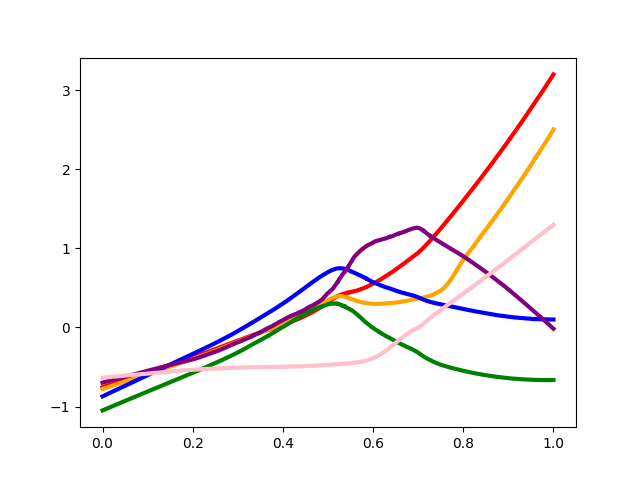

In [86]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(x0_loess_phate['pseudotime_scaled'], x0_loess_phate['Intensity_MedianIntensity_cycA'], label='cycA', c='red', linewidth='3')
ax.plot(x0_loess_phate['pseudotime_scaled'], x0_loess_phate['Intensity_MedianIntensity_cycB1'], label='cycB1', c='orange', linewidth='3')
ax.plot(x0_loess_phate['pseudotime_scaled'], x0_loess_phate['Intensity_MedianIntensity_cycD1'], label='cycD1', c='green', linewidth='3')
ax.plot(x0_loess_phate['pseudotime_scaled'], x0_loess_phate['Intensity_MedianIntensity_cycE'], label='cycE', c='blue', linewidth='3')
ax.plot(x0_loess_phate['pseudotime_scaled'], x0_loess_phate['Intensity_MedianIntensity_E2F1'], label='E2F1', c='purple', linewidth='3')
ax.plot(x0_loess_phate['pseudotime_scaled'], x0_loess_phate['Intensity_IntegratedIntensity_DNA'], label='DNA', c='pink', linewidth='3')


### Single Feature Exp

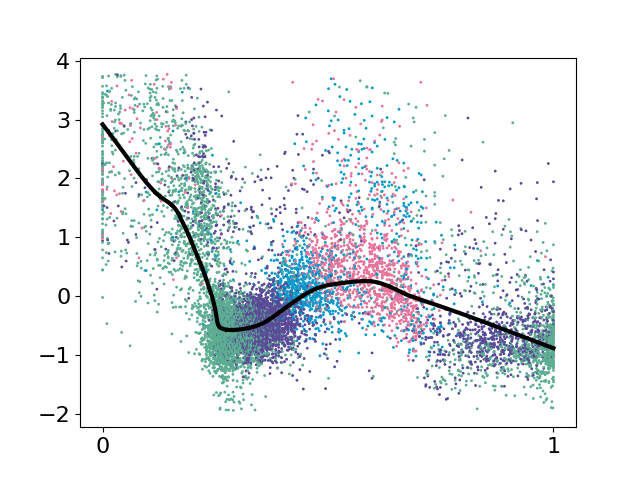

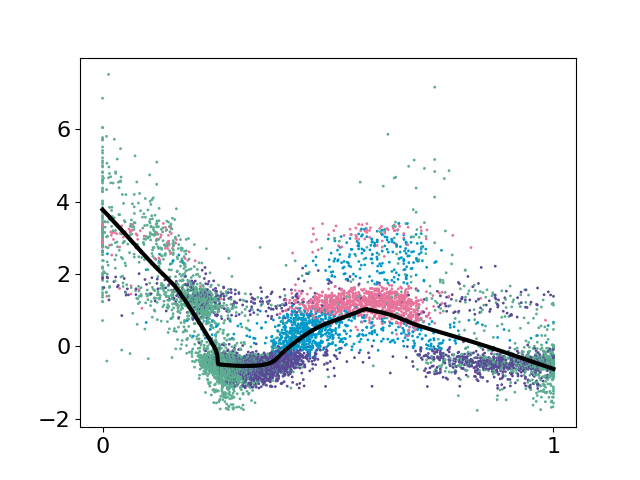

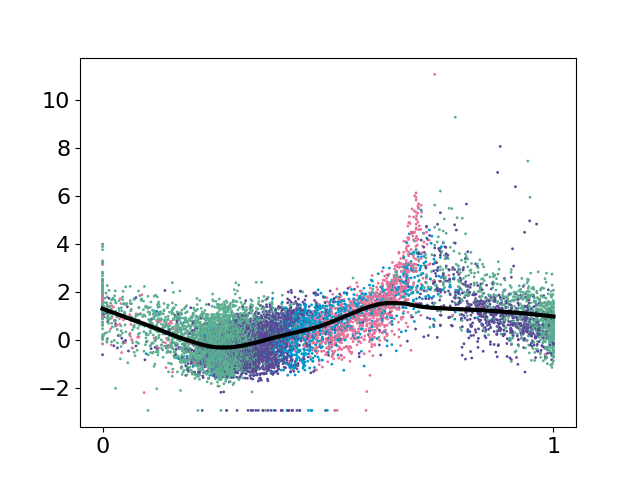

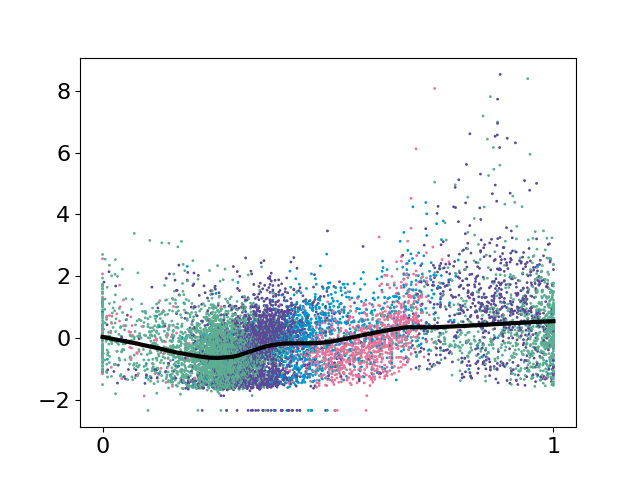

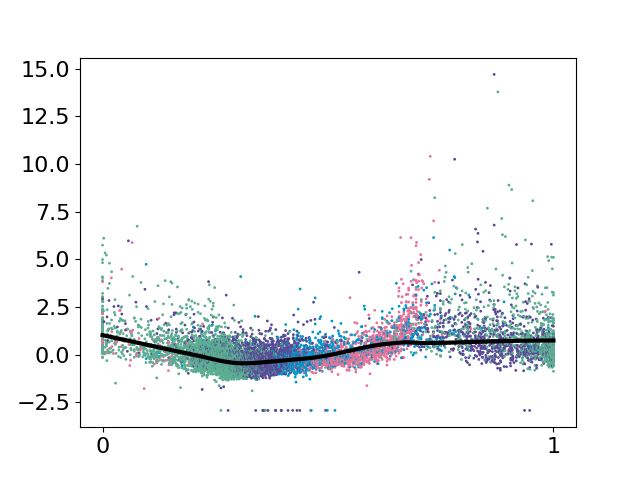

...

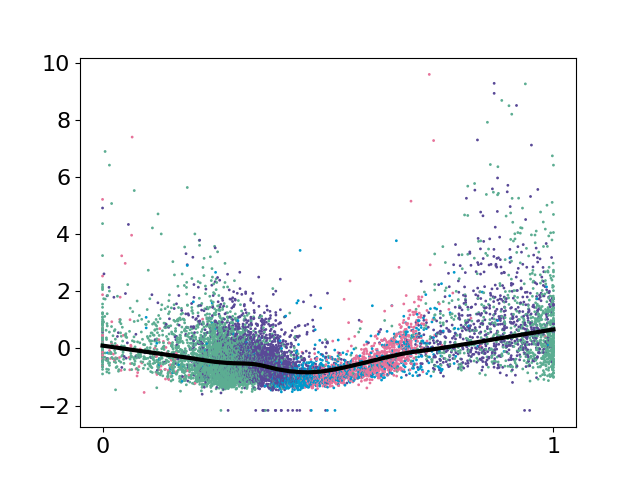

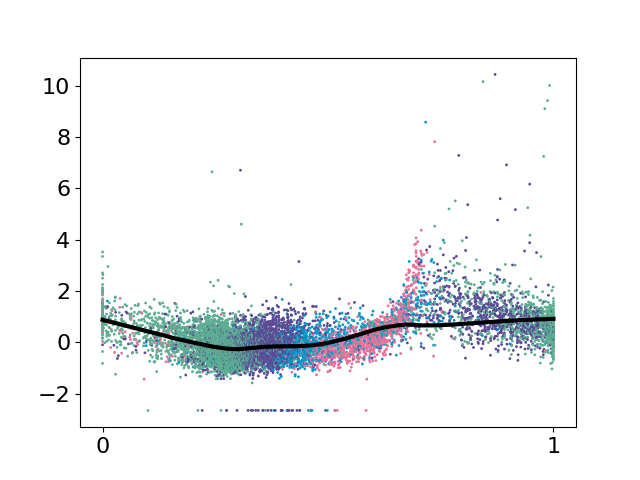

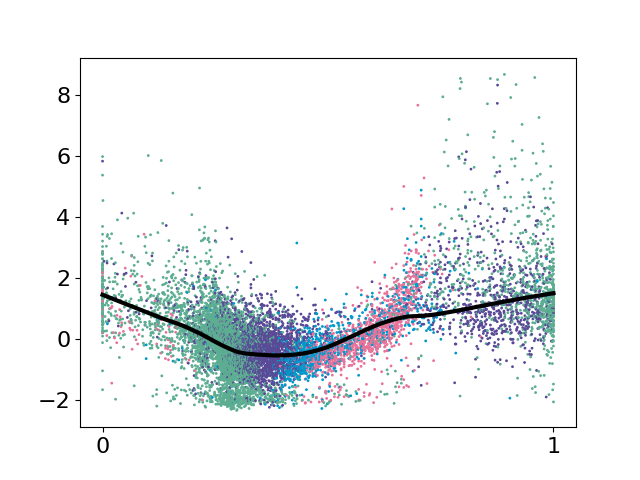

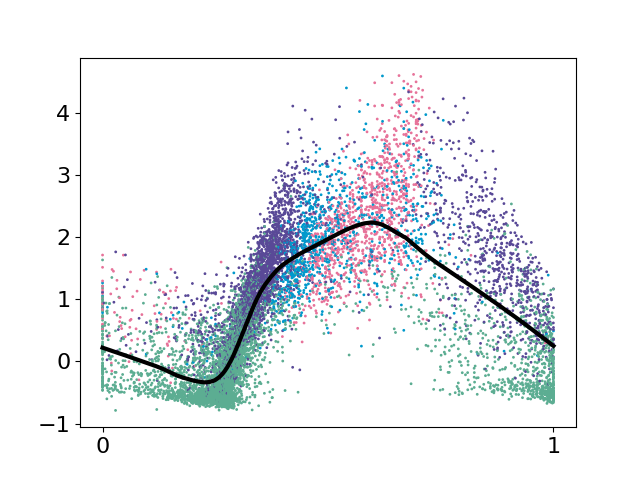

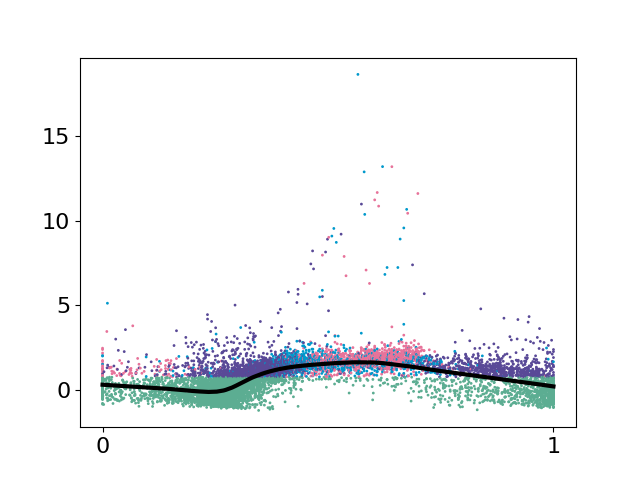

In [81]:
for feature in feature_names:
    fig = plt.figure()
    ax=fig.add_subplot(111)
    sling_colors = x0_sorted_spca['phase_colors']
    ax.scatter(x0_sorted_spca['pseudotime_scaled'], x0_sorted_spca[feature], c=sling_colors, s=1)
    ax.plot(x0_loess_spca['pseudotime_scaled'], x0_loess_spca[feature], label='0 nM', c='black', linewidth='3')
    # plt.xlabel('Pseudotime', fontsize=16)
    # plt.ylabel('pRB_over_RB', fontsize=10)
    ax.tick_params(labelsize=16)
    ax.set_xticks([0,1])

    plt.show()

    plt.savefig(f"figures/feature_ti/spca_{feature}.pdf", format="pdf", bbox_inches="tight")

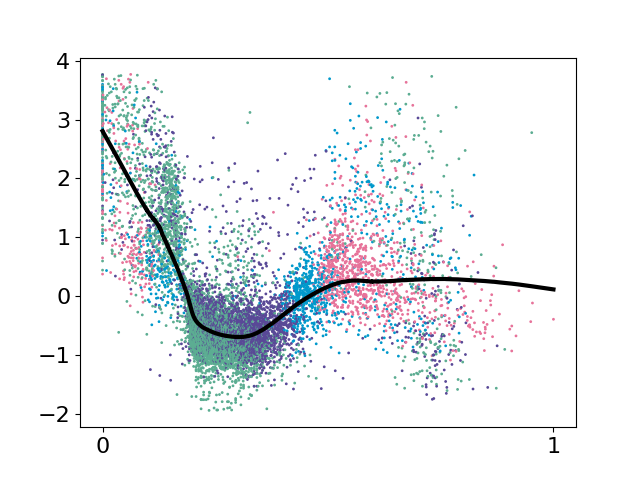

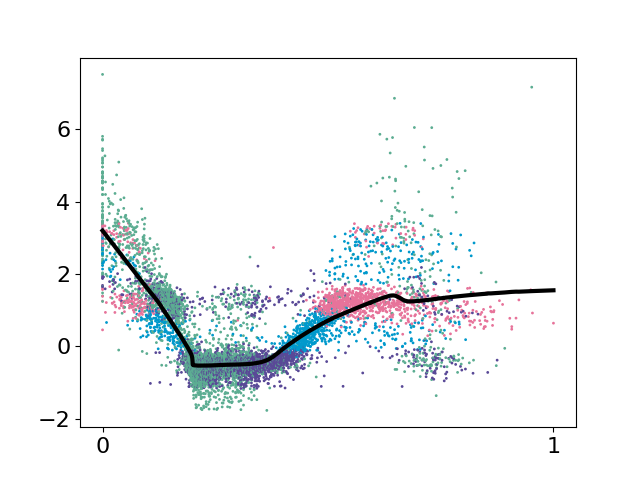

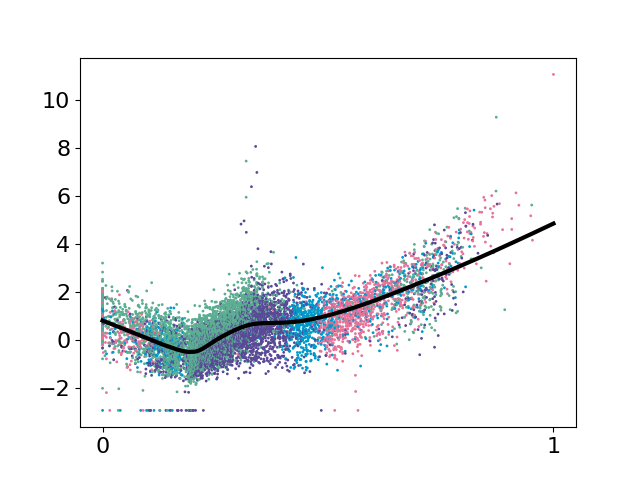

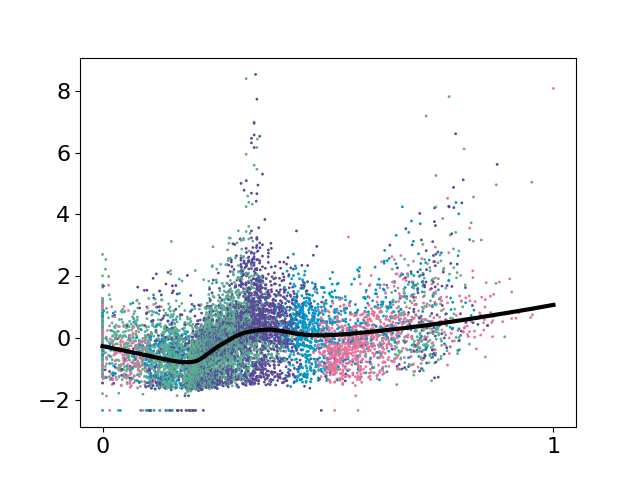

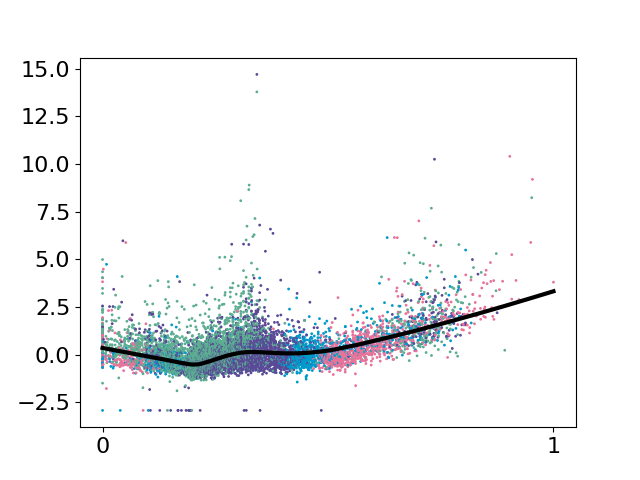

...

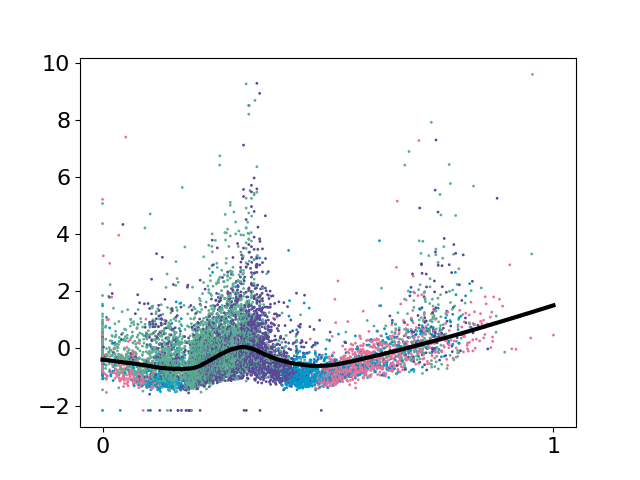

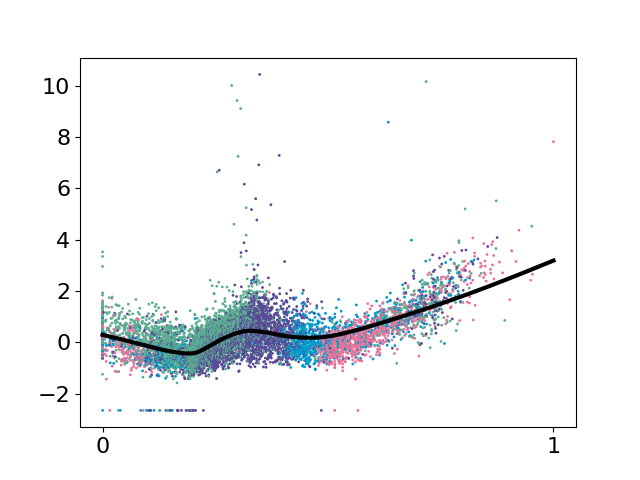

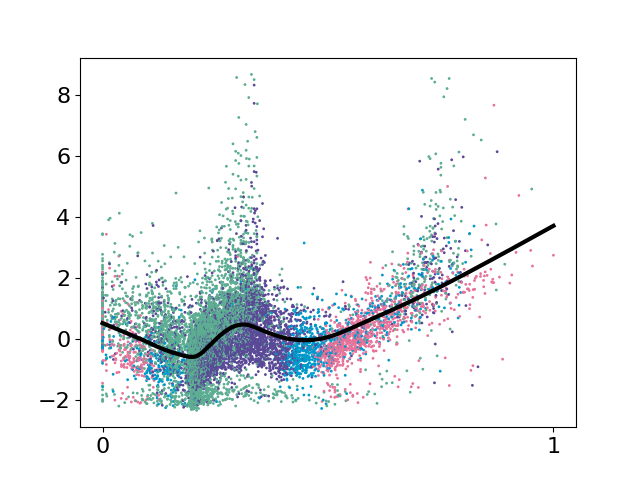

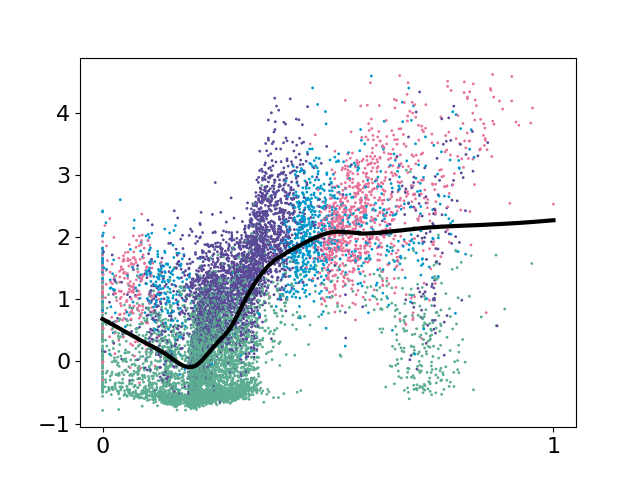

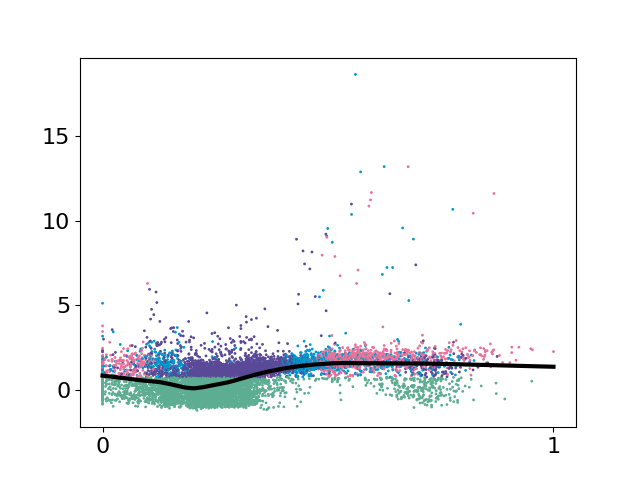

In [82]:
for feature in feature_names:
    fig = plt.figure()
    ax=fig.add_subplot(111)
    sling_colors = x0_sorted_pca['phase_colors']
    ax.scatter(x0_sorted_pca['pseudotime_scaled'], x0_sorted_pca[feature], c=sling_colors, s=1)
    ax.plot(x0_loess_pca['pseudotime_scaled'], x0_loess_pca[feature], label='0 nM', c='black', linewidth='3')
    # plt.xlabel('Pseudotime', fontsize=16)
    # plt.ylabel('pRB_over_RB', fontsize=10)
    ax.tick_params(labelsize=16)
    ax.set_xticks([0,1])

    plt.show()

    plt.savefig(f"figures/feature_ti/pca_{feature}.pdf", format="pdf", bbox_inches="tight")

In [ ]:
for feature in feature_names:
    fig = plt.figure()
    ax=fig.add_subplot(111)
    sling_colors = x0_sorted_phate['phase_colors']
    ax.scatter(x0_sorted_phate['pseudotime_scaled'], x0_sorted_phate[feature], c=sling_colors, s=1)
    ax.plot(x0_loess_phate['pseudotime_scaled'], x0_loess_phate[feature], label='0 nM', c='black', linewidth='3')
    # plt.xlabel('Pseudotime', fontsize=16)
    # plt.ylabel('pRB_over_RB', fontsize=10)
    ax.tick_params(labelsize=16)
    ax.set_xticks([0,1])

    plt.show()

    plt.savefig(f"figures/feature_ti/phate_{feature}.pdf", format="pdf", bbox_inches="tight")

### SPCA Trends

In [76]:
x1_loess_spca = pd.DataFrame()
x1_loess_spca['pseudotime_scaled'] = x1_sorted_spca['pseudotime_scaled']

x10_loess_spca = pd.DataFrame()
x10_loess_spca['pseudotime_scaled'] = x10_sorted_spca['pseudotime_scaled']

x100_loess_spca = pd.DataFrame()
x100_loess_spca['pseudotime_scaled'] = x100_sorted_spca['pseudotime_scaled']

x1000_loess_spca = pd.DataFrame()
x1000_loess_spca['pseudotime_scaled'] = x1000_sorted_spca['pseudotime_scaled']

In [ ]:
xx = x1_loess_spca['pseudotime_scaled']
for i in range(len(feature_names)):
    print(i)
    yy = x1_sorted_spca[feature_names[i]]
    xout, yout, wout = loess_1d.loess_1d(xx.to_numpy(), yy.to_numpy())
    x0_loess_spca[feature_names[i]] = yout

In [ ]:
xx = x10_loess_spca['pseudotime_scaled']
for i in range(len(feature_names)):
    print(i)
    yy = x10_sorted_spca[feature_names[i]]
    xout, yout, wout = loess_1d.loess_1d(xx.to_numpy(), yy.to_numpy())
    x0_loess_spca[feature_names[i]] = yout

In [ ]:
xx = x100_loess_spca['pseudotime_scaled']
for i in range(len(feature_names)):
    print(i)
    yy = x100_sorted_spca[feature_names[i]]
    xout, yout, wout = loess_1d.loess_1d(xx.to_numpy(), yy.to_numpy())
    x0_loess_spca[feature_names[i]] = yout

In [ ]:
xx = x1000_loess_spca['pseudotime_scaled']
for i in range(len(feature_names)):
    print(i)
    yy = x1000_sorted_spca[feature_names[i]]
    xout, yout, wout = loess_1d.loess_1d(xx.to_numpy(), yy.to_numpy())
    x0_loess_spca[feature_names[i]] = yout

KeyError: 'x1_loess_spca'

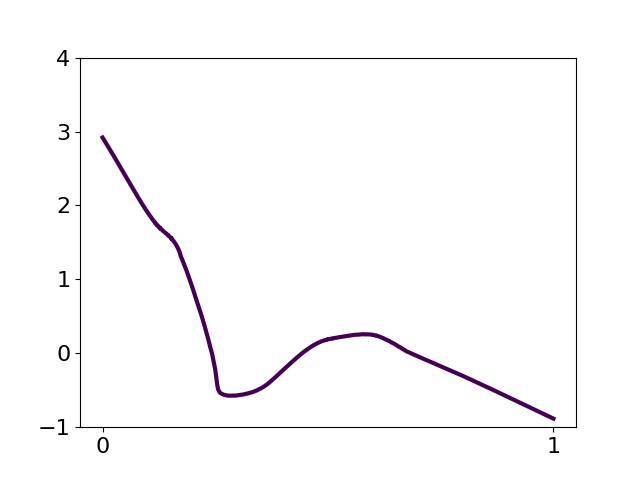

In [74]:
for i in range(len(feature_names)):
    fig = plt.figure()
    ax=fig.add_subplot(111)
    for j in range(1, len(trt_conditions)):
        ax.plot(vars()[f'x{trt_conditions[j]}_loess_spca']['pseudotime_scaled'], vars()[f'x{trt_conditions[j]}_loess_spca'][feature_names[i]], label=f'{trt_conditions[j]} nM', linewidth=3, c=trt_colors[j-1])
        ax.tick_params(labelsize=16)
        ax.set_xticks([0,1])
        ax.set_ylim(-1, 4)
        # ax.set_ylabel('Expression', labelsize=16)
        # ax.set_xlabel('Pseudotime', labelsize=16)
        # plt.savefig(f"fig3c_{feature_names[i]}_trends.pdf", format="pdf", bbox_inches="tight")
